In [287]:
import voila 

import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('genesis')
nltk.download('wordnet')
nltk.download('omw-1.4')

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from wordcloud import WordCloud
#from IPython.display import display
import base64

import string
import re


from collections import Counter, defaultdict
from time import time

# from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS as stopwords
from sklearn.metrics import log_loss
import matplotlib.pyplot as plt

from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation


from PIL import Image


from nltk.stem import PorterStemmer

stemmer = PorterStemmer()

from gensim.models import word2vec
from sklearn.manifold import TSNE

from sklearn.cluster import MiniBatchKMeans

from sklearn import cluster, metrics

from sklearn.preprocessing import StandardScaler, LabelEncoder
import seaborn as sns
import matplotlib.patheffects as PathEffects

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Jupiter\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Jupiter\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package genesis to
[nltk_data]     C:\Users\Jupiter\AppData\Roaming\nltk_data...
[nltk_data]   Package genesis is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Jupiter\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Jupiter\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [288]:
import PIL
from PIL import Image
from PIL import ImageFilter

# **1. Analyse des revues**

## Lecture de la donnée

In [289]:
reviews_academic_df = pd.DataFrame()
review_file = "data/yelp_academic_dataset_review.json"

In [290]:
nb_lines = sum(1 for line in open(review_file, encoding="utf8"))
print("il y a", nb_lines, "lignes de revues dans le fichier JSON")

il y a 6990280 lignes de revues dans le fichier JSON


In [291]:
with open(review_file, 'r', encoding="utf-8") as myfile:
    # Print the first 3 lines
    for x in range(3):
        print(next(myfile))

{"review_id":"KU_O5udG6zpxOg-VcAEodg","user_id":"mh_-eMZ6K5RLWhZyISBhwA","business_id":"XQfwVwDr-v0ZS3_CbbE5Xw","stars":3.0,"useful":0,"funny":0,"cool":0,"text":"If you decide to eat here, just be aware it is going to take about 2 hours from beginning to end. We have tried it multiple times, because I want to like it! I have been to it's other locations in NJ and never had a bad experience. \n\nThe food is good, but it takes a very long time to come out. The waitstaff is very young, but usually pleasant. We have just had too many experiences where we spent way too long waiting. We usually opt for another diner or restaurant on the weekends, in order to be done quicker.","date":"2018-07-07 22:09:11"}

{"review_id":"BiTunyQ73aT9WBnpR9DZGw","user_id":"OyoGAe7OKpv6SyGZT5g77Q","business_id":"7ATYjTIgM3jUlt4UM3IypQ","stars":5.0,"useful":1,"funny":0,"cool":1,"text":"I've taken a lot of spin classes over the years, and nothing compares to the classes at Body Cycle. From the nice, clean space a

In [292]:
chunkSize = 500000
chunk_list = []


with pd.read_json(
    review_file,
    dtype = {
        "review_id" : str,
        "user_id" : str,
        "business_id" : str,
        "stars" : int,
        "useful" : int,
        "funny" : int,
        "cool" : int,
        "text" : str,
        "date" : "datetime64[ns]"
    },
    chunksize = chunkSize,
    lines = True,
)as json_review_reader:
    # Load data in chunks
    for part in json_review_reader:
        chunk_list.append(part.sample(50000,random_state = 42))

reviews_academic_df = pd.concat(chunk_list)

In [293]:
reviews_academic_df = reviews_academic_df.sample(frac=0.3)

In [294]:
reviews_academic_df.shape

(210000, 9)

In [295]:
reviews_academic_df.dtypes

review_id              object
user_id                object
business_id            object
stars                   int32
useful                  int32
funny                   int32
cool                    int32
text                   object
date           datetime64[ns]
dtype: object

## Nettoyage des revues

In [296]:
reviews_academic_df.isna().mean()

review_id      0.0
user_id        0.0
business_id    0.0
stars          0.0
useful         0.0
funny          0.0
cool           0.0
text           0.0
date           0.0
dtype: float64

In [297]:
reviews_academic_df.head(5)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
499982,aEOx9y4wB_6ZMw6Rz8jM2A,2VDi7PQS_9nNOlRATVDSHg,pxITXo8ZoSmCq05eIEN1pw,5,0,0,0,Great meat and great people! We got about 3lbs...,2019-06-04 05:21:47
3421600,5IUmlOIUify_O6V3rjOgog,y9s_GvFldF3Dd7HROPZ2zg,o98oipVeD9yvKlYGhceqKg,4,0,0,0,We were in town visiting and needed a few item...,2021-05-09 02:08:52
1493958,fPP16M1CGgl1TnxcpUvO5Q,C-J0gDQi_BzsB4CSqTPQyQ,FmeoZuSHiV0eFrd5mF9DcQ,1,0,0,0,The staff could care less about you. There is ...,2017-08-30 22:49:43
6803858,l1-N9p2FaCZsjPQqARcT6A,PB77CRE32K4k7gUoc2LZWQ,62a6OyoicU1eJzb8W4rnxA,5,1,5,2,I'm driving peacefully down the road when all ...,2015-03-15 08:26:13
4528125,5790PYTF-zWaGM2NCUydBA,lBdyxfEl7HfSm5A7SHieTA,03dIEDBsDERr6Osmey-udQ,4,0,0,0,"Outstanding. The inside was all reserved, they...",2019-04-14 22:29:37


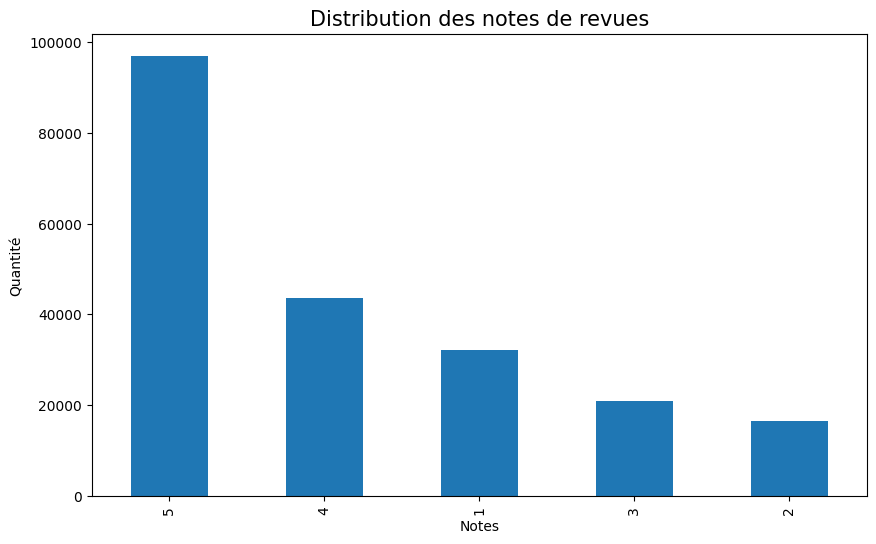

In [298]:
# Battant des différentes catégories de produits
plt.figure(figsize=(10, 6))
reviews_academic_df["stars"].value_counts().plot.bar(rot=90)
plt.title(
    "Distribution des notes de revues", fontsize=15)
plt.ylabel("Quantité")
plt.xlabel("Notes")
plt.show()

In [299]:
bad_reviews = reviews_academic_df[reviews_academic_df["stars"] < 2]

In [300]:
bad_reviews.head(5)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1493958,fPP16M1CGgl1TnxcpUvO5Q,C-J0gDQi_BzsB4CSqTPQyQ,FmeoZuSHiV0eFrd5mF9DcQ,1,0,0,0,The staff could care less about you. There is ...,2017-08-30 22:49:43
6121209,qgUUdIFQfY2wt7I97_RewQ,vu91ES7579H-rRFt1HS2Wg,R8Z_Dh5CkC3DfrE7NMr_jA,1,0,0,0,Unfortunately I would not recommend shopping h...,2020-05-31 23:17:30
5764672,B__f_Xl2qTAPIVVzNNI0Qg,3FjIlBItyZnhthNDLbk-_g,YcbdMImoJpmxeuyKuQz8Zg,1,1,0,0,"Long wait, mediocre food, overpriced\n\nAt the...",2012-01-20 03:07:49
4724178,BuVVW7f1vXnh8RmhG_CmqQ,BsPjkuS0zofYWHvohAVPeA,Zbge2bmY-o7A_VzsEqckqQ,1,0,0,0,"Shady billing, says ""no charge for equipment"" ...",2021-09-25 15:07:45
2922690,CiDXk7M4V_HqlOmKCszipQ,-nJMC32yGucnW9Whr9ktew,9MbjPWA9GfFYPH4mcqESoA,1,0,0,0,I went there on the opening day. The service w...,2017-10-29 20:52:26


In [301]:
bad_reviews.shape

(32056, 9)

In [302]:
list1 = ['1']
list1[0]

'1'

In [303]:
import os
def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def Convert(string):
    li = list(string.split(" "))
    return li

In [304]:
def clean_sentence(val):
    "remove chars that are not letters or numbers, downcase"
    regex = re.compile('([^\s\w]|_)+')
    sentence = regex.sub('', val).lower()
    listsentence = Convert(sentence)
    stemmed = stem_tokens(listsentence, stemmer)
    sentence = ' '.join(stemmed)
    

    
    #rollback
    '''sentence = sentence.split(" ")
    
    for word in list(sentence):
        if word in sw:
            sentence.remove(word)  
            
    sentence = " ".join(sentence)'''
    return sentence

def clean_dataframe(data):
    "drop nans, then apply 'clean_sentence' function to question1 and 2"
    data = data.dropna(how="any")
    
    for col in ['text']:
        data[col] = data[col].apply(clean_sentence)
    
    return data



bad_reviews = clean_dataframe(bad_reviews)
bad_reviews.head(5)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1493958,fPP16M1CGgl1TnxcpUvO5Q,C-J0gDQi_BzsB4CSqTPQyQ,FmeoZuSHiV0eFrd5mF9DcQ,1,0,0,0,the staff could care less about you there is a...,2017-08-30 22:49:43
6121209,qgUUdIFQfY2wt7I97_RewQ,vu91ES7579H-rRFt1HS2Wg,R8Z_Dh5CkC3DfrE7NMr_jA,1,0,0,0,unfortun i would not recommend shop here i bo...,2020-05-31 23:17:30
5764672,B__f_Xl2qTAPIVVzNNI0Qg,3FjIlBItyZnhthNDLbk-_g,YcbdMImoJpmxeuyKuQz8Zg,1,1,0,0,long wait mediocr food overpriced\n\nat the pe...,2012-01-20 03:07:49
4724178,BuVVW7f1vXnh8RmhG_CmqQ,BsPjkuS0zofYWHvohAVPeA,Zbge2bmY-o7A_VzsEqckqQ,1,0,0,0,shadi bill say no charg for equip in promo but...,2021-09-25 15:07:45
2922690,CiDXk7M4V_HqlOmKCszipQ,-nJMC32yGucnW9Whr9ktew,9MbjPWA9GfFYPH4mcqESoA,1,0,0,0,i went there on the open day the servic wa ver...,2017-10-29 20:52:26


## MOST FREQ WORDS

In [305]:
'''import os
def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed'''

def tokenize(text):
    tokenizer = nltk.RegexpTokenizer(r'\w{2,}')
    tokens = tokenizer.tokenize(text.encode().decode('utf-8').lower())
    tokens = [w for w in tokens if not w in list(sw)]
    #stems = stem_tokens(tokens, stemmer)
    return tokens

In [306]:
list_reviews = bad_reviews['text'].tolist()

In [307]:
test = list_reviews[0]

In [308]:
nltk.word_tokenize(test)

['the',
 'staff',
 'could',
 'care',
 'less',
 'about',
 'you',
 'there',
 'is',
 'a',
 'few',
 'younger',
 'staff',
 'member',
 'that',
 'think',
 'it',
 'funni',
 'to',
 'purpos',
 'put',
 'in',
 'the',
 'wrong',
 'order',
 'when',
 'they',
 'are',
 'take',
 'it',
 '13',
 'of',
 'a',
 'cup',
 'of',
 'chees',
 'for',
 'my',
 'fri',
 'thi',
 'place',
 'and',
 'these',
 'staff',
 'member',
 'dont',
 'deserv',
 'their',
 'job',
 'thi',
 'is',
 'the',
 '3rd',
 'time',
 'my',
 'order',
 'wa',
 'wrong',
 'and',
 'i',
 'wa',
 'treat',
 'unfairli',
 'what',
 'a',
 'shame',
 'i',
 'will',
 'not',
 'be',
 'back',
 'to',
 'thi',
 'one',
 'ever',
 'again',
 'ill',
 'starv',
 'or',
 'be',
 'hungri',
 'befor',
 'i',
 'do']

In [309]:
#tokenizer = nltk.RegexpTokenizer(r'\w{2,}')
#appelle de la fonction de steeming sur les tokens
tokenize(test)

['staff',
 'could',
 'care',
 'less',
 'younger',
 'staff',
 'member',
 'funni',
 'purpos',
 'wrong',
 'order',
 'take',
 '13',
 'cup',
 'chees',
 'fri',
 'thi',
 'place',
 'staff',
 'member',
 'dont',
 'deserv',
 'job',
 'thi',
 '3rd',
 'time',
 'order',
 'wa',
 'wrong',
 'wa',
 'treat',
 'unfairli',
 'shame',
 'back',
 'thi',
 'ever',
 'ill',
 'starv',
 'hungri',
 'befor']

In [310]:
tokenizer

RegexpTokenizer(pattern='\\w{2,}', gaps=False, discard_empty=True, flags=re.UNICODE|re.MULTILINE|re.DOTALL)

In [311]:
tokenizer

RegexpTokenizer(pattern='\\w{2,}', gaps=False, discard_empty=True, flags=re.UNICODE|re.MULTILINE|re.DOTALL)

Ici je rajoute des mots aux stop words que je juge non pertinent

In [319]:
my_sw = ('thing', 'see', 'need', 'since', 'look', 'put', 'tell', 'think', 'one', 'got', 'went', 'thi')

In [320]:
# On créé notre set de stopwords final qui cumule ainsi les 100 mots les plus fréquents du corpus ainsi
#que l'ensemble de stopwords par défaut présent dans la librairie NLTK
sw = set()
sw.update(tuple(nltk.corpus.stopwords.words('english')))
sw.update(most_freq)
sw.update(my_sw)

In [321]:
def freq_stats_corpora2():
    corpora = defaultdict(list)
    all_words = ''
    # Création d'un corpus de tokens par artiste
    for index, row in bad_reviews.iterrows():
        tokens = tokenizer.tokenize(row['text'].encode().decode('utf-8').lower())
        #tokens = tokenize(test)
        corpora[row["review_id"]] = [w for w in tokens if not w in list(sw) if w.isalpha()]
        
        all_words += ' '.join([w for w in tokens if not w in list(sw) if w.isalpha()])
    
    stats, freq = dict(), dict()

    for k, v in corpora.items():
        freq[k] = fq = nltk.FreqDist(v)
        stats[k] = {'total': len(v), 'unique': len(fq.keys())}
    return (freq, stats, corpora, all_words)

In [322]:
# Récupération des comptages
freq2, stats2, corpora2, all_words = freq_stats_corpora2()
df2 = pd.DataFrame.from_dict(stats2, orient = 'index')

In [323]:
'''tokens = tokenize(test)
tokens'''

['staff',
 'could',
 'care',
 'less',
 'younger',
 'staff',
 'member',
 'funni',
 'purpos',
 'wrong',
 'order',
 'take',
 '13',
 'cup',
 'chees',
 'fri',
 'thi',
 'place',
 'staff',
 'member',
 'dont',
 'deserv',
 'job',
 'thi',
 '3rd',
 'time',
 'order',
 'wa',
 'wrong',
 'wa',
 'treat',
 'unfairli',
 'shame',
 'back',
 'thi',
 'ever',
 'ill',
 'starv',
 'hungri',
 'befor']

In [324]:
df2.sort_values('total', ascending=False, inplace=True)

In [325]:
# Premièrement, on récupère la fréquence totale de chaque mot sur tout le corpus d'artistes
freq_totale2 = nltk.Counter()
for k, v in corpora2.items():
    freq_totale2 += freq2[k]

In [326]:
sorted(freq_totale2.items(), key=lambda pair: pair[1], reverse=True)

[('wa', 76235),
 ('thi', 38670),
 ('time', 17843),
 ('order', 17841),
 ('get', 17445),
 ('go', 15959),
 ('would', 15824),
 ('place', 15078),
 ('food', 15057),
 ('back', 14707),
 ('servic', 14411),
 ('call', 13487),
 ('ask', 12327),
 ('like', 12196),
 ('never', 11655),
 ('us', 11296),
 ('told', 11046),
 ('said', 10952),
 ('even', 10886),
 ('wait', 10348),
 ('becaus', 10239),
 ('veri', 9684),
 ('dont', 9452),
 ('custom', 9263),
 ('onli', 8852),
 ('didnt', 8787),
 ('want', 8446),
 ('minut', 8408),
 ('manag', 8227),
 ('could', 8116),
 ('come', 7798),
 ('day', 7757),
 ('tri', 7723),
 ('good', 7540),
 ('say', 7130),
 ('take', 6974),
 ('came', 6816),
 ('make', 6723),
 ('work', 6717),
 ('peopl', 6678),
 ('car', 6292),
 ('know', 6232),
 ('hour', 6073),
 ('give', 6032),
 ('im', 5998),
 ('busi', 5983),
 ('ha', 5936),
 ('befor', 5909),
 ('anoth', 5862),
 ('first', 5822),
 ('experi', 5528),
 ('ani', 5519),
 ('use', 5452),
 ('ever', 5451),
 ('took', 5439),
 ('restaur', 5269),
 ('tabl', 5210),
 ('two

In [327]:
# Deuxièmement on décide manière un peu arbitraire du nombre de mots les plus fréquents à supprimer.
#On pourrait afficher un graphe d'évolution du nombre de mots pour se rendre compte et avoir une meilleure heuristique. 
most_freq2 = list(zip(*freq_totale2.most_common(150)))[0]
most_freq2[:10]

('wa', 'thi', 'time', 'order', 'get', 'go', 'would', 'place', 'food', 'back')

*faire un graphique barchart sur les 10 premiers mots les plus fréquents !* **texte en gras**

## Word Cloud

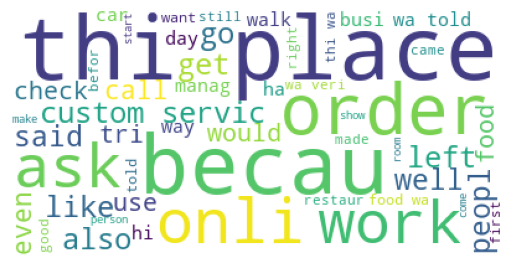

In [328]:
wordcloud = WordCloud(background_color = 'white', stopwords = list(sw), max_words = 50).generate(all_words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show();

In [329]:
all_words

'staff could care less younger staff member funni purpos wrong order take cup chees fri thi place staff member dont deserv job thi time order wa wrong wa treat unfairli shame back thi ever ill starv hungri beforunfortun would recommend shop bought sare ask blous made wa measur owner wa advis would make specif ask longer want stomach show veri much also request made tight pick week later wa told tailor would bring saturday return sunday thi blous wa tight wa veri short owner insist wa inch wasnt wa inch requir least inch owner wa continu insist blous wa fine even though button spread tight everywher loss wa measur copi insist could fix wa blous piec left add someth els take integr blous extrem disappoint wa mistak wa blame veri unprofession blame custom mistak wa clearli made would return sare blous piec offer give blous back sare refund refund exchang except told onli reason wa thi wa overheard daughter discuss similar colour thi reason return doe matter offer fix wa materi left whi do

In [253]:
#interpréter

Ici à partir du wordcloud on peut avoir une idée des différents topics d'insatisfactions

## TFIDF

In [335]:
tfidf = TfidfVectorizer(tokenizer = tokenize, stop_words = sw)
reviews = bad_reviews['text'].tolist()  
values = tfidf.fit_transform(reviews)
reviews_features = tfidf.get_feature_names()

D:\anaconda3\envs\env1\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [336]:
print("longeur de reviews: ")
print(len(reviews))
print("dimension de values: ")
print(values.shape)
print("longeur de reviews_features: ")
print(len(reviews_features))
'''print("Feature Names")'''
'''print(reviews_features)'''


longeur de reviews: 
32056
dimension de values: 
(32056, 45182)
longeur de reviews_features: 
45182


'print(reviews_features)'

In [337]:
values

<32056x45182 sparse matrix of type '<class 'numpy.float64'>'
	with 1681832 stored elements in Compressed Sparse Row format>

In [338]:
# Get top n tfidf values in row and return them with their corresponding feature names
def top_tfidf_feats(Xtr, features, row_id, top_n=25):
    row = np.squeeze(Xtr[row_id].toarray())
    # produce the indices that would order the row by tf-idf value, reverse them (into descending order), and select the top_n
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'tfidf']
    
    return df

In [339]:
top_feats_D1 = top_tfidf_feats(values, reviews_features, 0)
print("Top features in Rewiew_1\n", top_feats_D1, '\n')

top_feats_D2 = top_tfidf_feats(values, reviews_features, 1)
print("Top features in Rewiew_2\n", top_feats_D2, '\n')

Top features in Rewiew_1
      feature     tfidf
0     member  0.337926
1      staff  0.325907
2   unfairli  0.303715
3      wrong  0.248672
4    younger  0.232074
5      starv  0.214895
6     purpos  0.214427
7         13  0.199191
8      funni  0.198606
9        3rd  0.198606
10    hungri  0.179237
11    deserv  0.178994
12       cup  0.171124
13     shame  0.168606
14     order  0.152973
15       thi  0.152584
16     chees  0.141923
17       ill  0.137440
18       fri  0.136793
19      less  0.136520
20     treat  0.136114
21       job  0.134560
22      care  0.115507
23      ever  0.097627
24     befor  0.097246 

Top features in Rewiew_2
         feature     tfidf
0         blous  0.628131
1          sare  0.316953
2            wa  0.243320
3         tight  0.202714
4          inch  0.179291
5        insist  0.165453
6         owner  0.147903
7        measur  0.131854
8         blame  0.109653
9         would  0.107668
10  thouroughli  0.101641
11       return  0.100388
12        

In [155]:
def build_corpus(data):
    "Creates a list of lists containing words from each sentence"
    corpus = []
    for s in reviews:
        word_list = s.split(" ")
        corpus.append(word_list)
            
    return corpus

#corpus = build_corpus(reviews) 
corpus = corpora2
'''corpus[0:2]'''

'corpus[0:2]'

In [ ]:
corpus

In [156]:
reviews[0:2]

['bottom line stay away from this restaurant \n\nonly thing good at this restaurant was the atmosphere salad bar and some of the appetizers stay away from the mushrooms and main dishes this restaurant provides a lot of food for a price but the price doesnt match because of the quality for the price we paid we definitely had better price quality and quantity do not match \n\ni know i will receive comments for this statement saying that it was not this restaurant but we did not feel so well after eating here and regret visiting this establishment \n\nwill not check anything under the good for and best nights because i do not recommend eating at this establishment',
 'my scalp is extremely tender underneath my weave from this place and i have three scabs from my sew in no chemicals i dont understand how this happened but needless to say my weave is too tight also i asked for a curly weave that i could push back into a bun with no bumps and was assured that that was what i was going to rec

In [340]:
'''model = word2vec.Word2Vec(corpus, window=20, min_count=200, workers=4)'''

In [158]:
'''model_W2V.train(tokenize_sentences, total_examples=len(
    tokenize_sentences), epochs=50)'''

'model_W2V.train(tokenize_sentences, total_examples=len(\n    tokenize_sentences), epochs=50)'

In [159]:
'''model.wv['5']'''

"model.wv['5']"

In [121]:
#plot a tsne function inspired from a kaggle
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

In [122]:
#tsne prend beaucoup de termps a load*********************************************************
#tsne_plot(model)

In [160]:
bad_reviews

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1418746,i2RwOwf0tD19vpnrJsxJ9Q,6J-o8xj48knKOP9O6rc3Wg,ERzIS-WRLw-80_B4yqcG3Q,1,4,0,0,bottom line stay away from this restaurant \n\...,2010-08-21 03:21:53
2769736,EJwqR0MJPnus4Udc_EO72g,j7-xEJQf4fdPiLtmUN8aNg,kpW1VNKkomWJvlAkpoTvgg,1,2,0,0,my scalp is extremely tender underneath my wea...,2013-05-09 22:45:15
5384043,IF96VYdom5t9D9vgfbLjnw,O8cStyw5S_waCwN8TimWWg,JtLgjIFEPqw38jTqn1H00Q,1,0,0,0,you cant get a menu you have to beg for every...,2020-06-15 16:26:45
1444998,lc9LfhEkAlKyiECuVYRCew,gizWztowy81qnW_aIpjE_g,U4K7zPfbp9igbmmJfOyW_Q,1,0,0,0,the food usually is greasy and overpriced and ...,2017-01-15 19:35:37
651430,AXCGGKDRzUJ3D3CI3Vb2QQ,yFKcElcH1kxx-Wkce8aFPg,8KU5lsg69OIbpGUBmt43AQ,1,0,0,0,i have ordered from here a few times online\n\...,2021-04-26 02:39:10
...,...,...,...,...,...,...,...,...,...
5902600,Ktn9AgzVQAoOPCEOFt-gzw,u0de_BbxqluCLEbTiW942A,YvkadIJ-G9OPpnCOSW2ISg,1,0,0,0,im never coming back here again after my girlf...,2018-09-26 15:04:06
5498962,ePBF60Wd8PJnepYJv0_VHg,2NmgqS6vSPswGwA2YVWsXg,_S6oVV1LcSAFG74ZDxP8eg,1,5,1,0,not a good experience they took forever to cal...,2013-01-09 09:07:38
2170415,z2D4Sfk2dvUKJx4wP-BMJg,_3rlrcbW9hhZQaHACQshSA,ECOUuwE5H1HHE8xBfNAjFg,1,0,0,0,the service was not hospitable as all of the o...,2017-07-21 02:15:21
6654984,RkW1qLkobnmAxhbRY_prbg,kGwsSzSSmxHpFLiYAJecPw,rAe-1HU5Z-DuUXEbzASXDA,1,0,0,0,i cant tell you how the entrees were because w...,2012-01-23 15:48:04


# LDA

In [129]:
from gensim.models import CoherenceModel

## Cohérence Score

In [343]:
import pandas as pd
import json
from gensim.models import Phrases

'''postfile="../input/facebook/Post.json"
with open(postfile, encoding='utf-8-sig') as f:
    post = json.load(f)

data=pd.DataFrame(post)

data['Message_Processed'] = data["Message"].map(lambda x: preprocess_text(x))
'''
import gensim
from gensim.utils import simple_preprocess

def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))



x = reviews

docs = list(sent_to_words(x))


bigram = Phrases(docs, min_count=10)
trigram = Phrases(bigram[docs])

In [344]:
for idx in range(len(docs)):
    for token in bigram[docs[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            docs[idx].append(token)
    for token in trigram[docs[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            docs[idx].append(token)

In [345]:
from gensim.corpora.dictionary import Dictionary
#Remove rare & common tokens 
# Create a dictionary representation of the documents.

dictionary = Dictionary(docs)
dictionary.filter_extremes(no_below=10, no_above=0.2)
#Create dictionary and corpus required for Topic Modeling
corpus = [dictionary.doc2bow(doc) for doc in docs]
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))
print(corpus[:1])

Number of unique tokens: 9340
Number of documents: 32056
[[(0, 1), (1, 1), (2, 1), (3, 3), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 2), (17, 1), (18, 1), (19, 1), (20, 1), (21, 3), (22, 6), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 2), (30, 1)]]


In [346]:
corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 3),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 2),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 3),
  (22, 6),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 2),
  (30, 1)],
 [(5, 1),
  (24, 1),
  (26, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 2),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 3),
  (40, 1),
  (41, 3),
  (42, 2),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 2),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 2),
  (52, 1),
  (53, 1),
  (54, 2),
  (55, 1),
  (56, 2),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 3),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 3),
  (67, 1),
  (68, 2),
  (69, 1),
  (70, 1),
  (71, 3),
  (72, 1),
  (73, 3),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 2),
  (78, 1),
  (79, 1),
  (80, 3),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 2),
  (85, 2),
  (86, 1),
  (87, 3),
  (88, 2)

In [347]:
id2word

{0: 'anything',
 1: 'appetizers',
 2: 'atmosphere',
 3: 'away',
 4: 'bar',
 5: 'best',
 6: 'better',
 7: 'bottom',
 8: 'bottom_line',
 9: 'check',
 10: 'comments',
 11: 'definitely',
 12: 'did',
 13: 'did_not',
 14: 'dishes',
 15: 'doesnt',
 16: 'doesnt_match',
 17: 'eating',
 18: 'eating_here',
 19: 'establishment',
 20: 'feel',
 21: 'good',
 22: 'know',
 23: 'line',
 24: 'lot',
 25: 'lot_of',
 26: 'main',
 27: 'main_dishes',
 28: 'match',
 29: 'mushrooms',
 30: 'nights',
 31: 'not_recommend',
 32: 'only_thing',
 33: 'paid',
 34: 'price',
 35: 'provides',
 36: 'quality',
 37: 'quantity',
 38: 'receive',
 39: 'recommend',
 40: 'regret',
 41: 'restaurant',
 42: 'salad',
 43: 'salad_bar',
 44: 'saying',
 45: 'some',
 46: 'statement',
 47: 'stay',
 48: 'stay_away',
 49: 'thing',
 50: 'this_establishment',
 51: 'under',
 52: 'visiting',
 53: 'well',
 54: 'also',
 55: 'annoying',
 56: 'around',
 57: 'asked',
 58: 'assured',
 59: 'bit',
 60: 'bumps',
 61: 'bun',
 62: 'chemicals',
 63: 'clean

In [348]:
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
# Set parameters.
num_topics = 10
chunksize = 500 
passes = 20 
iterations = 400
eval_every = 1  

# Make a index to word dictionary.
temp = dictionary[0]  # only to "load" the dictionary.
id2word = dictionary.id2token

lda_model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)
# Print the Keyword in the 10 topics
print(lda_model.print_topics())

[(0, '0.061*"my_husband" + 0.058*"at_least" + 0.031*"veri_disappoint" + 0.025*"fri" + 0.024*"least" + 0.023*"husband" + 0.018*"minut_later" + 0.018*"my_girlfriend" + 0.016*"ice_cream" + 0.015*"disappoint"'), (1, '0.072*"an_hour" + 0.071*"hour" + 0.043*"at_pm" + 0.033*"deal_with" + 0.030*"pm" + 0.028*"kind_of" + 0.021*"know_how" + 0.018*"reserv" + 0.017*"kind" + 0.014*"final_got"'), (2, '0.043*"pick_up" + 0.027*"pick" + 0.024*"drive" + 0.018*"feel_like" + 0.017*"mess_up" + 0.014*"rip_off" + 0.013*"park_lot" + 0.013*"drive_thru" + 0.013*"no_idea" + 0.011*"mess"'), (3, '0.017*"she" + 0.011*"he" + 0.010*"her" + 0.008*"want" + 0.008*"us" + 0.008*"didnt" + 0.007*"other" + 0.007*"will_never" + 0.007*"manag" + 0.007*"by"'), (4, '0.088*"custom_servic" + 0.051*"custom" + 0.028*"star" + 0.026*"ive_ever" + 0.025*"worst" + 0.021*"ever" + 0.019*"deliveri" + 0.018*"give" + 0.017*"card" + 0.017*"credit_card"'), (5, '0.036*"nail" + 0.028*"an_appoint" + 0.022*"hair" + 0.020*"my_daughter" + 0.019*"appoin

In [349]:
coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.3981400789964017



Coherence Score:  [0.4240088580304615, 0.38289486017560775, 0.3538744463522126, 0.26596240321634423, 0.44321648910337264, 0.3600310016671964, 0.41970298815669815, 0.5677953893935663, 0.45207924300544244, 0.31183511086311455]


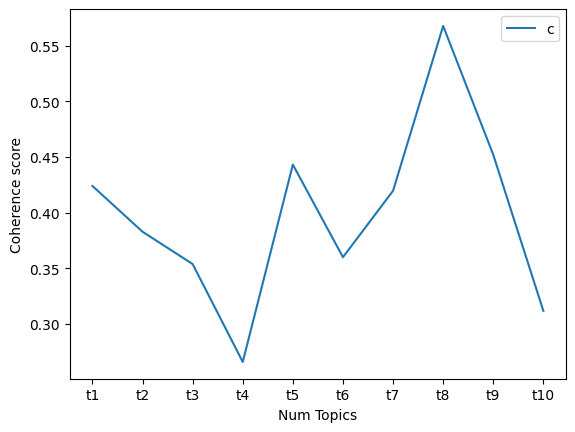

In [350]:
# Compute Coherence Score using c_v
coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
coherence_ldas = coherence_model_lda.get_coherence_per_topic()
print('\nCoherence Score: ', coherence_ldas)

import matplotlib.pyplot as plt
import numpy as np
topicsname=[]
for i in range(1,num_topics+1):
    topicsname.append("t{0}".format(i))
topicsname

plt.plot(topicsname,coherence_ldas)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

D'après le score de cohérence le nombre de topics optimale est de 8.

In [359]:
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
# Set parameters.
num_topics = 8
chunksize = 500 
passes = 20 
iterations = 400
eval_every = 1  

# Make a index to word dictionary.
temp = dictionary[0]  # only to "load" the dictionary.
id2word = dictionary.id2token

final_lda_model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)
# Print the Keyword in the 10 topics
print(final_lda_model.print_topics())

[(0, '0.028*"he" + 0.018*"car" + 0.016*"charg" + 0.016*"tell_me" + 0.009*"day" + 0.008*"pay" + 0.008*"new" + 0.008*"my_husband" + 0.007*"price" + 0.007*"less_than"'), (1, '0.050*"an_hour" + 0.040*"hour" + 0.036*"pick_up" + 0.030*"at_pm" + 0.023*"pick" + 0.021*"pm" + 0.017*"drive" + 0.014*"on_saturday" + 0.013*"minut" + 0.012*"park"'), (2, '0.027*"star" + 0.027*"one_star" + 0.026*"these_peopl" + 0.024*"hung_up" + 0.022*"rip_off" + 0.019*"my_sister" + 0.019*"wish_could" + 0.017*"zero_star" + 0.017*"furnitur" + 0.016*"too_mani"'), (3, '0.012*"day" + 0.011*"phone" + 0.008*"ha_been" + 0.008*"show_up" + 0.008*"week" + 0.007*"care" + 0.007*"deal_with" + 0.007*"ha" + 0.007*"am" + 0.007*"appoint"'), (4, '0.015*"custom_servic" + 0.013*"custom" + 0.012*"will_never" + 0.010*"thi_place" + 0.009*"more" + 0.008*"can" + 0.008*"ever" + 0.008*"other" + 0.008*"peopl" + 0.007*"how"'), (5, '0.035*"she" + 0.021*"us" + 0.020*"her" + 0.015*"he" + 0.013*"minut" + 0.012*"didnt" + 0.012*"come" + 0.011*"came" + 0

In [360]:
'''# Compute Coherence Score using UMass
coherence_model_lda = CoherenceModel(model=final_lda_model, texts=docs, dictionary=dictionary, coherence="u_mass")
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)'''


Coherence Score:  -2.7313657731066794


In [352]:
'''def compute_coherence_values(dictionary, corpus, texts,coherence, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    topic_coherence_values=[]
    for num_topics in range(start, limit+1, step):
        model=LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence=coherence)
        coherence_values.append(coherencemodel.get_coherence())
        topic_coherence_values.append(coherencemodel.get_coherence_per_topic())

    return model_list, coherence_values, topic_coherence_values'''

In [353]:
'''limit=10; start=1; step=1;
model_list_cv, coherence_values_cv, topic_coherence_values_cv =compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=docs,coherence="c_v", start=start, limit=limit, step=step)'''

In [354]:
'''print("Coherence score for each Topic Model (c_v):")
print(coherence_values_cv)
print("--------------------")
model=1
for topic_coherence_value_cv in topic_coherence_values_cv:
    print(f"Coherence score for topics of Model {model}:")
    print(topic_coherence_value_cv)
    model=model+1'''

Coherence score for each Topic Model (c_v):
[0.22668619465890522, 0.27848746802326807, 0.24496444341222554, 0.3126203044724707, 0.31783924848103473, 0.3213778179932278, 0.37001615679158056, 0.34352490646112094, 0.34529160739946557, 0.38294680726040736]
--------------------
Coherence score for topics of Model 1:
[0.22668619465890522]
Coherence score for topics of Model 2:
[0.3015948158726213, 0.25538012017391487]
Coherence score for topics of Model 3:
[0.23495885405860012, 0.2881133575069893, 0.21182111867108708]
Coherence score for topics of Model 4:
[0.3163331439872872, 0.282802819971561, 0.24146356939681385, 0.4098816845342208]
Coherence score for topics of Model 5:
[0.2964536974091584, 0.48016162253577227, 0.31063431859186463, 0.25085411253318524, 0.2510924913351931]
Coherence score for topics of Model 6:
[0.4796870746448362, 0.3122542925961592, 0.3176032238027269, 0.2534069762616566, 0.28696875022887935, 0.27834659042510823]
Coherence score for topics of Model 7:
[0.462902126778006

In [366]:
'''# Show graph
import matplotlib.pyplot as plt
import numpy as np
models=[]
for i in range(1,limit+1):
    models.append("model{0}".format(i))

plt.figure(figsize=(8,6))
plt.plot(models, coherence_values_cv,label="c_v")
plt.title("Coherence score comparing (c_v)")
plt.xlabel("Trained Topic Models")
plt.ylabel("Coherence score")
plt.legend()
plt.xticks(rotation=45)

plt.show()'''

'# Show graph\nimport matplotlib.pyplot as plt\nimport numpy as np\nmodels=[]\nfor i in range(1,limit+1):\n    models.append("model{0}".format(i))\n\nplt.figure(figsize=(8,6))\nplt.plot(models, coherence_values_cv,label="c_v")\nplt.title("Coherence score comparing (c_v)")\nplt.xlabel("Trained Topic Models")\nplt.ylabel("Coherence score")\nplt.legend()\nplt.xticks(rotation=45)\n\nplt.show()'

In [365]:
'''import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

tf_vectorizer = CountVectorizer(strip_accents = 'unicode',
                                stop_words = 'english',
                                lowercase = True,
                                token_pattern = r'\b[a-zA-Z]{3,}\b',
                                max_df = 0.5,
                                min_df = 10)
dtm_tf = tf_vectorizer.fit_transform(bad_reviews["text"])

# for TF DTM
lda_tf = LatentDirichletAllocation(n_components=4, random_state=0)
#final_lda_model.fit(dtm_tf)

pyLDAvis.sklearn.prepare(lda_model, dtm_tf, tf_vectorizer)'''

'import pyLDAvis\nimport pyLDAvis.sklearn\npyLDAvis.enable_notebook()\nfrom sklearn.datasets import fetch_20newsgroups\nfrom sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer\nfrom sklearn.decomposition import LatentDirichletAllocation\n\ntf_vectorizer = CountVectorizer(strip_accents = \'unicode\',\n                                stop_words = \'english\',\n                                lowercase = True,\n                                token_pattern = r\'\x08[a-zA-Z]{3,}\x08\',\n                                max_df = 0.5,\n                                min_df = 10)\ndtm_tf = tf_vectorizer.fit_transform(bad_reviews["text"])\n\n# for TF DTM\nlda_tf = LatentDirichletAllocation(n_components=4, random_state=0)\n#final_lda_model.fit(dtm_tf)\n\npyLDAvis.sklearn.prepare(lda_model, dtm_tf, tf_vectorizer)'

# **2. Analyses des photos**

## Lecture de la donnée

In [ ]:
photos_file = "data/photos.json"
photos_df = pd.DataFrame()

In [ ]:
with open(photos_file, 'r') as myfile:
    # Print the first 3 lines
    for x in range(3):
        print(next(myfile))

In [ ]:
print(sum(1 for line in open(photos_file, encoding="utf8")))

In [ ]:
chunkSize_photos = 50000
chunk_list = []

with pd.read_json(
    photos_file,
    dtype={
        "photo_id": str,
        "business_id": str,
        "caption": str,
        "label": str,
    },
    chunksize=chunkSize_photos,
    lines=True,
) as json_photos_reader:
    # Load data in chunks
    for part in json_photos_reader:
        chunk_list.append(part)

photos_df = pd.concat(chunk_list)

In [ ]:
photos_df.shape

In [ ]:
photos_df.head()

## Nettoyage de la donnée

In [ ]:
photos_df.isna().mean()

In [ ]:
unique_labels = photos_df['label'].unique()
print(unique_labels)

On récupère 100 images de chaque catégories pour en faire un dataFrame si le dossier comportant les images n'est pas déjà initialisé

In [ ]:
lista = []
for label in unique_labels:  
    lista.append(photos_df[photos_df['label'] == label].sample(100))
photos_df = pd.concat(lista)

In [ ]:
photos_df.shape

In [ ]:
photos_df.head()

In [ ]:
first_image = photos_df['photo_id'].iloc[0] + ".jpg"

On doit convertir les photos en gris qu'on va stocker dans un dossier nomé "photos_grises"

In [ ]:
path_sep = os.path.sep

# répertoire courant, ne se termine PAS par un séparateur
current_path = os.path.abspath(os.getcwd()) +  path_sep + "data"

# Répertoire où seront rangées les photos converties en GRIS
rep_photos_gris = "photos_grises"

#path final vers le dossier des photos grises
path_photos_gris = current_path + path_sep + rep_photos_gris

In [ ]:
isExist = os.path.exists(path_photos_gris)

if not isExist:
    
    os.makedirs(path_photos_gris)
    print("The file as been created !")

In [ ]:
print("Le dossier visé comporte " + str(len(os.listdir(path_photos_gris))) + " fichiers")
if len(os.listdir(path_photos_gris)) == 0:
    print("Convertion des photos")

    #Répertoire des photos
    path_photos = current_path + path_sep + "photos"

    #Liste des id des images
    photo_id_list = photos_df['photo_id'].tolist()

    #Pour chaque images on les convertit en gris puis on les sauvegarde dans le répertoire des photos grises
    for photo_id in photo_id_list:

        nom_photo = photo_id + ".jpg"
        

        img = Image.open(path_photos + path_sep + nom_photo)
        img_grey = PIL.ImageOps.grayscale(img)
        img_grey.save(path_photos_gris + path_sep + nom_photo)
        #print("id de la photo sauvegadé : " + photo_id)

else:
    print("Répertoire " + path_photos_gris + " non vide!")

In [ ]:
print("Le dossier comportant les photos grises comporte : " + str(len(os.listdir(path_photos_gris))) + " fichiers")

On essaye avec une image du dossier "photos_grises"

In [ ]:
path_first_image = path_photos_gris+ path_sep + first_image

In [ ]:
plt.figure(figsize=[15, 200])
img = Image.open(path_first_image)
matrice = np.array(img)
plt.subplot(1, 1, 1)
plt.grid(False)
plt.axis("off")
plt.title("Image originale")
plt.imshow(matrice, cmap='gray', vmin=0, vmax=255)

On peut récupérer les différentes caractéristiques de l'image

In [ ]:
# Récupérer et afficher la taille de l'image (en pixels)
w, h = img.size
print("Largeur : {} px, hauteur : {} px".format(w, h))

# Afficher son mode de quantification
print("Format des pixels : {}".format(img.mode))

# Récupérer et afficher la valeur du pixel à une position précise
px_value = img.getpixel((20,100))
print("Valeur du pixel situé en (20,100) : {}".format(px_value))

# Récupérer les valeurs de tous les pixels sous forme d'une matrice
mat = np.array(img)
mat

# Afficher la taille de la matrice de pixels
print("Taille de la matrice de pixels : {}".format(mat.shape))

In [ ]:
# Charger l'image comme matrice de pixels
img = np.array(Image.open(path_first_image))

# Générer et afficher l'histogramme
# Pour le normaliser : argument density=True dans plt.hist
# Pour avoir l'histogramme cumulé : argument cumulative=True
n, bins, patches = plt.hist(img.flatten(), bins=range(256))
plt.show()

On essayer les différents correctifs sur l'image pour voir si ça améliore l'image et du coup si il faut les garder ou pas.

In [ ]:
plt.figure(figsize=[25, 200])

subplot_line = 1
subplot_col = 4
suplot_index = 0

#affichage de l'image original
img = Image.open(path_first_image)
matrice = np.array(img)
plt.subplot(subplot_line, subplot_col, suplot_index+1)
plt.grid(False)
plt.axis("off")
plt.title("Image originale")
plt.imshow(matrice, cmap='gray', vmin=0, vmax=255)

#affichage de l'image avec la correction de ma surexposition
img_exposition_fixed = PIL.ImageOps.autocontrast(img, cutoff=0, ignore=None, mask=None, preserve_tone=False)
mat_exposition_fixed = np.array(img_exposition_fixed)
plt.subplot(subplot_line, subplot_col, suplot_index+2)
plt.grid(False)
plt.axis("off")
plt.title("Image avec correction de l'exposition")
plt.imshow(mat_exposition_fixed, cmap='gray', vmin=0, vmax=255)

#affichage de l'image avec la correction du contraste
img_contrast_fixed = PIL.ImageOps.equalize(img, mask=None)
mat_contrast_fixed = np.array(img_contrast_fixed)
plt.subplot(subplot_line, subplot_col, suplot_index+3)
plt.grid(False)
plt.axis("off")
plt.title("Image avec correction du contraste")
plt.imshow(mat_contrast_fixed, cmap='gray', vmin=0, vmax=255)

plt.show()

Ici on peut voir le que la correction de la surexposition ne change rien.

In [ ]:
fig, ((ax0, ax1, ax2)) = plt.subplots(nrows=1, ncols=3)
fig.set_figheight(5)
fig.set_figwidth(10)

img = np.array(Image.open(path_first_image))
ax0.hist(img.flatten(), bins=range(256))

ax0.set_title('Image original')

img = np.array(img_exposition_fixed)
ax1.hist(img.flatten(), bins=range(256))

ax1.set_title('Image avec correction de l exposition')

img = np.array(img_contrast_fixed)
ax2.hist(img.flatten(), bins=range(256))

ax2.set_title('Image avec correction du contraste')

fig.tight_layout()
plt.show()

On peut voir que la correction du contraste améliore l'image en égalisant les niveaux de gris. 

On souhaite ensuite examiner le résultat de l'application des différents filtres (correction du bruit, les filtres gaussien et médian)
pour voir si elles améliorent l'image ou au contraire elle les détériore

In [ ]:
plt.figure(figsize=[25, 200])

subplot_line = 1
subplot_col = 4
suplot_index = 0

#affichage de l'image de base
img = Image.open(path_first_image)
matrice = np.array(img)
plt.subplot(subplot_line, subplot_col, suplot_index+1)
plt.grid(False)
plt.axis("off")
plt.title("Image de base")
plt.imshow(matrice, cmap='gray', vmin=0, vmax=255)

#affichage de correction du bruit
img_noise_fixed = img.filter(ImageFilter.BoxBlur(1))
mat_noise_fixed = np.array(img_noise_fixed)
plt.subplot(subplot_line, subplot_col, suplot_index+2)
plt.grid(False)
plt.axis("off")
plt.title("affichage de correction du bruit")
plt.imshow(mat_noise_fixed, cmap='gray', vmin=0, vmax=255)

#affichage du filtre gaussien
img_gaussian_filter = img.filter(ImageFilter.GaussianBlur(2))
mat_gaussian_filter = np.array(img_gaussian_filter)
plt.subplot(subplot_line, subplot_col, suplot_index+3)
plt.grid(False)
plt.axis("off")
plt.title("affichage du filtre gaussien")
plt.imshow(mat_gaussian_filter, cmap='gray', vmin=0, vmax=255)

#affichage du filtre médian
img_median_filter = img.filter(ImageFilter.MedianFilter(3))
mat_median_filter = np.array(img_median_filter)
plt.subplot(subplot_line, subplot_col, suplot_index+4)
plt.grid(False)
plt.axis("off")
plt.title("affichage du filtre médian")
plt.imshow(mat_median_filter, cmap='gray', vmin=0, vmax=255)


plt.show()

On peut voir que la correction du bruit détériore l'image, le filtre gaussien rend l'image flout et que le filtre médian à l'air de correctement corriger l'image.

In [ ]:
plt.figure(figsize=[25, 200])

subplot_line = 1
subplot_col = 4
suplot_index = 0

#affichage de l'image de base
img = Image.open(path_first_image)
matrice = np.array(img)
plt.subplot(subplot_line, subplot_col, suplot_index+1)
plt.grid(False)
plt.axis("off")
plt.title("Image de base")
plt.imshow(matrice, cmap='gray', vmin=0, vmax=255)

#affichage de l'image avec la correction du contraste
img_contrast_fixed = PIL.ImageOps.equalize(img, mask=None)
mat_contrast_fixed = np.array(img_contrast_fixed)
plt.subplot(subplot_line, subplot_col, suplot_index+2)
plt.grid(False)
plt.axis("off")
plt.title("Image avec correction du contraste")
plt.imshow(mat_contrast_fixed, cmap='gray', vmin=0, vmax=255)

#affichage du filtre médian
img_median_filter = img.filter(ImageFilter.MedianFilter(3))
mat_median_filter = np.array(img_median_filter)
plt.subplot(subplot_line, subplot_col, suplot_index+3)
plt.grid(False)
plt.axis("off")
plt.title("affichage du filtre médian")
plt.imshow(mat_median_filter, cmap='gray', vmin=0, vmax=255)

#affichage du correctif contraste + filtre médian 
img_contrast_fixed = PIL.ImageOps.equalize(img, mask=None)
img_contrast_fixed_median_filter = img_contrast_fixed.filter(ImageFilter.MedianFilter(3))
mat_constrat_fixed_median_filter = np.array(img_contrast_fixed_median_filter)
plt.subplot(subplot_line, subplot_col, suplot_index+4)
plt.grid(False)
plt.axis("off")
plt.title("affichage du correctif contrast + filtre médian")
plt.imshow(mat_constrat_fixed_median_filter, cmap='gray', vmin=0, vmax=255)

plt.show()

In [ ]:
# Répertoire où seront rangées les photos optimisées
rep_photos_corrige = "photos_corrigees"

path_photos_corrige = current_path + path_sep + rep_photos_corrige
print(path_photos_corrige)

In [ ]:
isExist = os.path.exists(path_photos_corrige)
if not isExist:

    path = path_photos_corrige
    os.makedirs(path)
    print("The file as been created !")

In [ ]:
if len(os.listdir(path_photos_corrige)) == 0:
    
    photo_id_list = photos_df['photo_id'].tolist()

    for photo_id in photo_id_list:
      
        nom_photo = photo_id + ".jpg"
        img = Image.open(path_photos_gris + path_sep + nom_photo)
        #on applique les deux filtres
        img_contrast_fixed = PIL.ImageOps.equalize(img, mask=None)
        img_contrast_fixed_median_filter = img_contrast_fixed.filter(ImageFilter.MedianFilter(3))
        mat_constrat_fixed_median_filter = np.array(img_contrast_fixed_median_filter)
        img_corrige = Image.fromarray(mat_constrat_fixed_median_filter)
        
        img_corrige.save(path_photos_corrige + path_sep + nom_photo)

else:
    print("photos corrige déjà existantes")

In [ ]:
import cv2

first_image_cv2 = cv2.imread(path_first_image)

def gen_sift_features(gray_img):
    sift = cv2.xfeatures2d.SIFT_create()
    # kp is the keypoints
    #
    # desc is the SIFT descriptors, they're 128-dimensional vectors
    # that we can use for our final features
    kp, desc = sift.detectAndCompute(gray_img, None)
    return kp, desc

def show_sift_features(gray_img, color_img, kp):
    return plt.imshow(cv2.drawKeypoints(gray_img, kp, color_img.copy()))

# generate SIFT keypoints and descriptors
first_image_kp, first_image_desc = gen_sift_features(first_image_cv2)

print('Here are what our SIFT features look like for the first_image:')
show_sift_features(first_image_cv2, first_image_cv2, first_image_kp);

Ici la première étape est de créer un dataframe de 500 image (100 images par labels) ensuite extraire les descripteurs avec SIFT de ces 500 images puis appliquer kmeans qui va nous donner le visual bag of words avec k = 100 par exemple

Maintenant qu'on a réussi à obtenir les features sur une seule image on va extraire les features des 500 images qu'on a sélectionné 

## Récuperation des features

In [ ]:
def get_images_features_df():
    df = pd.DataFrame()
    #on parcours chaque image
    for photo in photos_df.itertuples():
        nom_photo = photo.photo_id + ".jpg"
        nom_photo_path = path_photos_corrige + path_sep + nom_photo

        photo_gris_corrige = Image.open(nom_photo_path)
        photo_gris_corrige_mat = np.array(photo_gris_corrige)
        kp, des = gen_sift_features(photo_gris_corrige_mat)
        
        df = df.append(
            {
                "id": photo.photo_id,
                "label": photo.label,
                "features": kp,
                "features_descriptors": des,
            },
            ignore_index=True,
        )
        
    return df

In [ ]:
df_bovw = get_images_features_df()

In [ ]:
'''print("Le dossier comportant les photos grises comporte : " + str(len(os.listdir(path_photos_gris))) + " fichiers")'''

In [ ]:
df_bovw.head()

In [ ]:
all_desc = []
for desc_list in df_bovw["features_descriptors"]:
    for desc in desc_list:
        all_desc.append(desc)

In [ ]:
'''all_desc[0]'''

In [ ]:
# On normalise la data avant le K-Means
all_desc_scaler = StandardScaler().fit(all_desc)
all_desc_scaler_std = all_desc_scaler.transform(all_desc)

In [ ]:
'''all_desc_scaler_std[0]'''

## Clustering avec K-means

In [ ]:
kmeans_std = cluster.KMeans(
    n_clusters = 50, n_init=16, init='k-means++', random_state=42)
kmeans_std.fit(all_desc_scaler_std)

In [ ]:
'''all_desc_scaler_std[0:10]'''

In [ ]:
kmeans_std.predict(all_desc_scaler_std[0:49])

In [ ]:
# On ajoute tous les clusters(les visual words) trouvés pour chaque image dans 1 nouvelle colonne du dataframe
df_bovw["descriptors_clustered"] = [
    kmeans_std.predict(np.array(all_desc_scaler.transform(desc), dtype=np.float))
    for desc in df_bovw["features_descriptors"]
]

In [ ]:
# On ajoute tous les clusters(les visual words) trouvés pour chaque image dans 1 nouvelle colonne du dataframe
df_bovw["descriptors_clustered"] = [
    kmeans_std.predict(np.array(all_desc_scaler.transform(desc), dtype=float))
    for desc in df_bovw["features_descriptors"]
]

In [ ]:
df_bovw

Ici nous voulais extraitre le nombre de pixels présent dans les 50 clusters après avoir créé une colonnes pour chaque cluster

In [ ]:
n_features = 50
color_kmeans = MiniBatchKMeans(n_clusters=n_features, random_state=42).fit(
    all_desc_scaler_std
)

In [ ]:
df_bovw["descriptors_clustered"] = [
    kmeans_std.predict(np.array(all_desc_scaler.transform(desc), dtype=float))
    for desc in df_bovw["features_descriptors"]
]

In [ ]:
n_features

In [ ]:
for px_cluster in range(n_features):
    df_bovw[f"cluster_{px_cluster}"] = 0

    for i, photo in df_bovw.iterrows():
        df_bovw.loc[i, f"cluster_{px_cluster}"] = list(df_bovw.loc[i, "descriptors_clustered"]).count(px_cluster)


In [ ]:
df_bovw[
    ["descriptors_clustered"] + [f"cluster_{i}" for i in range(n_features)]
].head(5)

In [ ]:
#kmeans avec k = 5 
#et utiliser l'indice de rand adjusted pour voir la qualité des cluster
#suite partie deep learning, méthode transfer learning -> vgg16 (modèle pré entrainé sur des images), l'utiliser pour avoir des variable
#cours lire l'architecture CNN, deux partie deuxieme partei s'appelle fully connected. il faut charger QUE la première partie
#ça va générer un dataframe refaire un kmean dessus et ensuite comparer les kmeans de sift et de CNN

In [ ]:
df_clusters = df_bovw[
    [f"cluster_{i}" for i in range(n_features)]
]

In [ ]:
df_clusters.head(5)

In [ ]:
# Centrage et Réduction des valeurs
data_clusters_scaled = StandardScaler().fit_transform(df_clusters)

In [ ]:
km_clusters = cluster.KMeans(
    n_clusters = 5, n_init=16, init='k-means++', random_state=42)
km_clusters.fit(data_clusters_scaled)

In [ ]:
plan_tsne_sift = TSNE(random_state = 42).fit_transform(data_clusters_scaled)

Une fonction qui va nous permettre de dessiner les différents clusters

In [ ]:
def draw_scatter(x, colors):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:, 0], x[:, 1], lw=0, s=40,
                    c=palette[colors.astype(np.int)])
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

In [ ]:
draw_scatter(plan_tsne_sift, km_clusters.labels_)

In [ ]:
km_clusters.labels_.shape

In [ ]:
df_bovw.head()

In [ ]:
le = LabelEncoder()
df_bovw['image_label_le'] = le.fit_transform(df_bovw['label'])
image_label_encoded_arr = np.array(
    df_bovw['image_label_le'])

In [ ]:
image_label_encoded_arr.shape

In [ ]:
metrics.adjusted_rand_score(km_clusters.labels_, image_label_encoded_arr)

#**3. Transfert learning : Implémentation de VGG**

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.layers import Dense
from keras import Model,optimizers
from keras.applications.imagenet_utils import preprocess_input
import cv2 as cv


In [ ]:
from tensorflow.keras.utils import load_img, img_to_array

In [ ]:
rep_photos = 'photos'
path_photos_orig = current_path + path_sep + rep_photos
rep_photos_redim = 'photos_redimensionnees'
path_photos_redim = current_path + path_sep + rep_photos_redim

isExist = os.path.exists(path_photos_redim)

if not isExist:
    
    os.makedirs(path_photos_redim)
    print("The file as been created !")
print(rep_photos_redim)

In [ ]:
rep_photos_redim

In [ ]:
if len(os.listdir(path_photos_redim)) == 0:
    print("Création des photos couleur redimenssionées")

    # On récupère la liste des noms d'image
    photo_id_list = photos_df['photo_id'].tolist()

    for photo_id in photo_id_list:
    
        nom_photo = photo_id + ".jpg"
        img = Image.open(path_photos + path_sep + nom_photo)

        # Nouvelle taille d'image
        size = (224, 224)
        img_resized = img.resize(size)
        # puis on la sauvegarde
        img_resized.save(path_photos_redim + path_sep + nom_photo)

else:
    print("Le répo est pas vide")

In [ ]:
#test avec la première image

In [ ]:
photo = photos_df.sample().iloc[0]
nom_photo = photo.photo_id + '.jpg'
img_path = path_photos_redim + path_sep + nom_photo

In [ ]:
img = load_img(img_path, target_size=(224, 224, 3))  # Charger l'image
img = img_to_array(img)  # Convertir en tableau numpy
'''print(img.shape)'''
img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16
'''print(img.shape)'''

In [ ]:
# Charger VGG-16 pré-entraîné sur ImageNet et sans les couches fully-connected
model = VGG16(weights="imagenet", include_top=False, input_shape = (224, 224, 3))

In [ ]:
for layer in model.layers:
    layer.trainable = False

In [ ]:
y = model.predict(img)

In [ ]:
y.shape

In [ ]:
#29/09
#mettre y dans un dataframe pour chaque image 
#ARI sur le kmeans des deux méthodes comparer la meilleur méthode

In [ ]:
def get_vgg_prediction(photo_id):
    nom_photo = photo_id + '.jpg'
    img_path = path_photos_redim + path_sep + nom_photo
    img = load_img(img_path, target_size=(224, 224, 3))  # Charger l'image
    img = img_to_array(img)  # Convertir en tableau numpy

    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
    img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16
    y = model.predict(img)
    return y

In [ ]:
# On ajoute tous les clusters(les visual words) trouvés pour chaque image dans 1 nouvelle colonne du dataframe
df_bovw["vgg_predictions"] = [
    get_vgg_prediction(photo_id)
    for photo_id in df_bovw["id"]
]

In [ ]:
df_bovw[
    ["id"] + ["vgg_predictions"]
].head(5)

In [ ]:
def get_vgg_predictions():
    ys = []
    for photo in photos_df.itertuples():
        nom_photo = photo.photo_id + '.jpg'
        img_path = path_photos_redim + path_sep + nom_photo
        img = load_img(img_path, target_size=(224, 224, 3))  # Charger l'image
        img = img_to_array(img)  # Convertir en tableau numpy

        img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
        img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16
        y = model.predict(img)
        ys.append(y.flatten())
    return ys

In [ ]:
y = get_vgg_predictions()

In [ ]:
y_scaled = StandardScaler().fit_transform(y)

In [ ]:
kmeans_vgg = cluster.KMeans(
    n_clusters = 5, n_init = 200, init = 'k-means++', random_state = 42)
kmeans_vgg.fit(y_scaled)

In [ ]:
draw_scatter(plan_tsne_sift, kmeans_vgg.labels_)

In [ ]:
metrics.adjusted_rand_score(kmeans_vgg.labels_, image_label_encoded_arr)

On peut voir que l'adjusted rand score du modèle SIFT est plus élevé que celui du modèle VGG